In [1]:
import os
import pandas as pd
import csv
from urllib.request import urlretrieve
from statsmodels.formula.api import ols
pd.options.mode.chained_assignment = None

In [2]:
need_df = pd.read_parquet('../data/curated/yellow taxi.parquet')
need_df.shape

(8657731, 8)

In [3]:
need_df.drop_duplicates(inplace= True)
need_df = need_df.reset_index(drop=True)

In [4]:
need_df.tpep_pickup_datetime.head()

0   2021-12-01 00:19:51
1   2021-12-01 00:29:07
2   2021-12-01 00:12:40
3   2021-12-01 00:10:18
4   2021-12-01 00:25:12
Name: tpep_pickup_datetime, dtype: datetime64[ns]

#### data cleaning

In [5]:
#check missing value
need_df.isnull().sum()

tpep_pickup_datetime     0
tpep_dropoff_datetime    0
trip_distance            0
PULocationID             0
DOLocationID             0
payment_type             0
fare_amount              0
tip_amount               0
dtype: int64

In [6]:
#check pick_up datetime
need_df = need_df[(need_df["tpep_pickup_datetime"] >= "2021-12-01 00:00:00") & (need_df["tpep_pickup_datetime"] <= "2022-02-28 23:59:59")]
need_df.shape

(8656935, 8)

In [7]:
#cheeck trip distance
print (need_df.trip_distance.min(), need_df.trip_distance.max())

0.0 348798.53


In [8]:
#payment_type
print (need_df.payment_type.min(), need_df.payment_type.max())

0 5


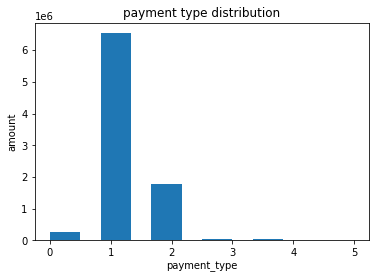

<function matplotlib.pyplot.close(fig=None)>

In [9]:
#plot payment type
import matplotlib.pyplot as plt
plt.hist(need_df.payment_type, bins = 6,width=0.5,align="mid")
plt.xlabel('payment_type')
plt.ylabel('amount')
plt.title('payment type distribution')
plt.savefig('../plots/payment type distribution.jpg', dpi = 200, bbox_inches = 'tight')
plt.show()
plt.close

In [10]:
#As the payment type 3 and 4 are too few, delete them
need_df = need_df[(need_df.payment_type == 0)|(need_df.payment_type == 1)|(need_df.payment_type == 2)]
print(need_df)
need_df.shape

        tpep_pickup_datetime tpep_dropoff_datetime  trip_distance  \
0        2021-12-01 00:19:51   2021-12-01 00:37:01           9.30   
1        2021-12-01 00:29:07   2021-12-01 00:45:13           2.76   
2        2021-12-01 00:12:40   2021-12-01 00:27:17           3.40   
3        2021-12-01 00:10:18   2021-12-01 00:19:20           1.30   
4        2021-12-01 00:25:12   2021-12-01 00:39:07           3.10   
...                      ...                   ...            ...   
8657074  2022-02-28 23:50:00   2022-03-01 00:06:00           3.40   
8657075  2022-02-28 23:06:57   2022-02-28 23:19:12           3.48   
8657076  2022-02-28 23:48:13   2022-03-01 00:03:33           3.05   
8657077  2022-02-28 23:56:41   2022-03-01 00:04:57           2.62   
8657078  2022-02-28 23:04:00   2022-02-28 23:10:00           1.41   

         PULocationID  DOLocationID  payment_type  fare_amount  tip_amount  
0                 138           141             1        26.50        7.60  
1                

(8579671, 8)

In [11]:
#check amount
need_df[['fare_amount', 'tip_amount']].describe()

,fare_amount,tip_amount
count,8.579671e+06,8.579671e+06
mean,1.357220e+01,2.524382e+00
std,1.261770e+01,2.933346e+00
min,-5.800000e+02,-9.801000e+01
25%,6.500000e+00,9.300000e-01
50%,9.500000e+00,2.060000e+00
75%,1.500000e+01,3.160000e+00
max,3.009000e+03,8.888800e+02


In [12]:
#as amount cannot be negative
#fare_amount should >= 2.5, because of the taxi rule
need_df = need_df[(need_df.fare_amount >= 2.5) & (need_df.tip_amount >= 0)]
need_df.shape


(8568484, 8)

In [13]:
need_df[(need_df.fare_amount <= need_df.trip_distance * 2.5 + 50) & (need_df.fare_amount >= need_df.trip_distance * 2.5 - 50)].describe()

,trip_distance,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount
count,8.532750e+06,8.532750e+06,8.532750e+06,8.532750e+06,8.532750e+06,8.532750e+06
mean,3.218078e+00,1.654324e+02,1.630921e+02,1.173226e+00,1.333993e+01,2.504953e+00
std,4.070646e+00,6.558185e+01,7.045475e+01,4.554848e-01,1.139606e+01,2.832657e+00
min,0.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,2.500000e+00,0.000000e+00
25%,1.100000e+00,1.320000e+02,1.130000e+02,1.000000e+00,6.500000e+00,9.800000e-01
50%,1.800000e+00,1.620000e+02,1.620000e+02,1.000000e+00,9.500000e+00,2.060000e+00
75%,3.280000e+00,2.340000e+02,2.340000e+02,1.000000e+00,1.500000e+01,3.160000e+00
max,2.577000e+02,2.650000e+02,2.650000e+02,2.000000e+00,6.680000e+02,8.888800e+02


In [14]:
# Remove those data which trips don't match the fare_amount
need_df = need_df[(need_df.fare_amount <= need_df.trip_distance * 2.5 + 50) & (need_df.fare_amount >= need_df.trip_distance * 2.5 - 50)]
need_df.shape

(8532750, 8)

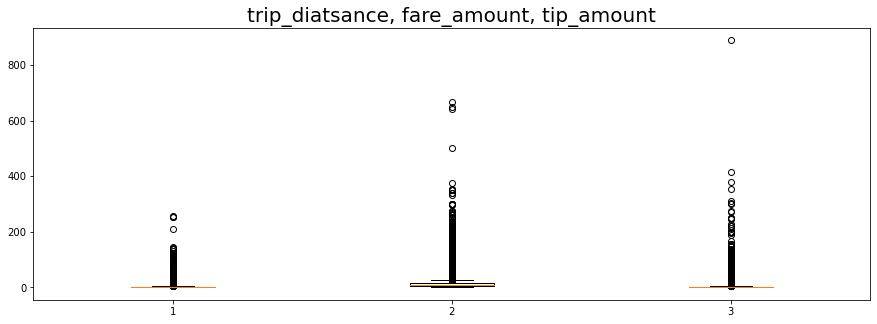

<function matplotlib.pyplot.close(fig=None)>

In [15]:
#check outliers
box_1, box_2, box_3 = need_df.trip_distance, need_df.fare_amount, need_df.tip_amount
plt.figure(figsize=(15,5))
plt.title('trip_diatsance, fare_amount, tip_amount',fontsize=20)
plt.boxplot([box_1, box_2, box_3], showbox = True)
plt.savefig('../plots/trip_diatsance, fare_amount, tip_amount.jpg', dpi = 200, bbox_inches = 'tight')
plt.show()
plt.close

In [16]:
cols = ['trip_distance', 'fare_amount', 'tip_amount']
Q1 = need_df[cols].quantile(0.25)
Q3 = need_df[cols].quantile(0.75)
IQR =  Q3 - Q1

In [17]:
no_outliers = need_df[~((need_df[cols] < (Q1 - 1.5 * IQR)) | (need_df[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]
no_outliers.shape

(7451039, 8)

<function matplotlib.pyplot.close(fig=None)>

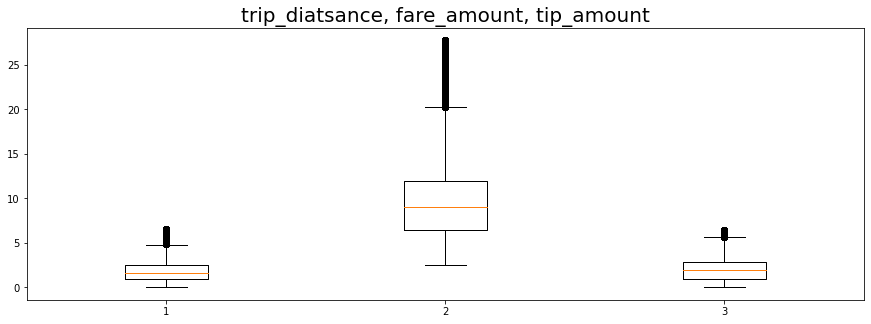

In [18]:
plt.figure(figsize=(15,5))
plt.title('trip_diatsance, fare_amount, tip_amount',fontsize=20)
plt.boxplot([no_outliers.trip_distance, no_outliers.fare_amount, no_outliers.tip_amount], showbox = True)
plt.close

#### extra data clean

In [19]:
#read data
pd.options.mode.chained_assignment = None
covid = pd.read_csv('../data/curated/covid.csv')

In [20]:
#Filter reserved rows
covid.loc[covid["date_of_interest"] == '12/01/2021'], covid.loc[covid["date_of_interest"] == '02/28/2022']

(     Unnamed: 0 date_of_interest  CASE_COUNT  BX_CASE_COUNT  BK_CASE_COUNT  \
 641         641       12/01/2021        2180            279            700   
 
      MN_CASE_COUNT  QN_CASE_COUNT  SI_CASE_COUNT  
 641            395            584            220  ,
      Unnamed: 0 date_of_interest  CASE_COUNT  BX_CASE_COUNT  BK_CASE_COUNT  \
 730         730       02/28/2022         707             57            197   
 
      MN_CASE_COUNT  QN_CASE_COUNT  SI_CASE_COUNT  
 730            248            156             49  )

In [21]:
covid.drop(covid.index[0:641],inplace=True)
covid.drop(covid.index[90:],inplace=True)

#### Feature engineering

In [22]:
# Use income_rate to represent the income of taxi drivers
# income_rate = income / time
# income = fare_amount	+ tip_amount, time = tpep_dropoff_datetime - tpep_pickup_datetime
# The waiting time and calling time are ignored here, assuming the same time for each driver to receive the order


In [23]:
time = (no_outliers.tpep_dropoff_datetime - no_outliers.tpep_pickup_datetime).to_numpy().astype('timedelta64[s]').astype(float)/60
no_outliers['minutes'] = time

In [24]:
no_outliers.loc[no_outliers.payment_type == 1 , ['fare_amount', 'tip_amount']]

,fare_amount,tip_amount
2,13.5,2.00
3,6.5,2.05
4,12.5,2.50
6,17.5,4.26
7,11.0,2.66
...,...,...
8555335,12.0,1.50
8555336,8.0,3.50
8555338,7.5,2.26
8555339,20.5,4.86


In [25]:
# as cash tips are not included, I need estimate cash tips
cash_ratio = (no_outliers.tip_amount / no_outliers.fare_amount).mean()

In [26]:
no_outliers.loc[no_outliers.payment_type == 2, 'tip_amount'] = no_outliers.loc[no_outliers.payment_type == 2, 'fare_amount'] * cash_ratio

In [27]:
income = (no_outliers.fare_amount + no_outliers.tip_amount).to_numpy()

In [28]:
no_outliers['income'] = income

In [29]:
# get judging criteria
income_rate = no_outliers.income / no_outliers.minutes
no_outliers['income_rate'] = income_rate

In [30]:
# Consider the impact of weekends and peaks
no_outliers['hour'] = no_outliers.tpep_pickup_datetime.dt.hour
no_outliers['day'] = no_outliers.tpep_pickup_datetime.dt.day_of_week

In [31]:
#let Turn the numbers into weeks
week = {0:'Monday',
1:'Tuesday',
2:'Wednesday',
3:'Thursday',
4:'Friday',
5:'Saturday',
6:'Sunday'}
no_outliers.day = no_outliers.day.map(week)

#### Feature Cleaning

In [32]:
no_outliers[['minutes', 'income_rate']].describe()

,minutes,income_rate
count,7.451039e+06,7.451039e+06
mean,1.305993e+01,inf
std,6.266185e+01,NaN
min,-1.044726e+05,-1.632000e+03
25%,6.450000e+00,9.579399e-01
50%,1.008333e+01,1.113427e+00
75%,1.503333e+01,1.335977e+00
max,2.933652e+04,inf


In [33]:
# As minutes cannot be the negative, delete them
no_outliers = no_outliers.drop(no_outliers[no_outliers['minutes'] <= 0].index)

In [34]:
no_outliers[['minutes', 'income_rate']].describe()

,minutes,income_rate
count,7.446756e+06,7.446756e+06
mean,1.308156e+01,1.511093e+00
std,4.962481e+01,9.846551e+00
min,1.666667e-02,3.323503e-04
25%,6.450000e+00,9.579832e-01
50%,1.008333e+01,1.113402e+00
75%,1.503333e+01,1.335789e+00
max,2.933652e+04,1.879200e+03


<function matplotlib.pyplot.close(fig=None)>

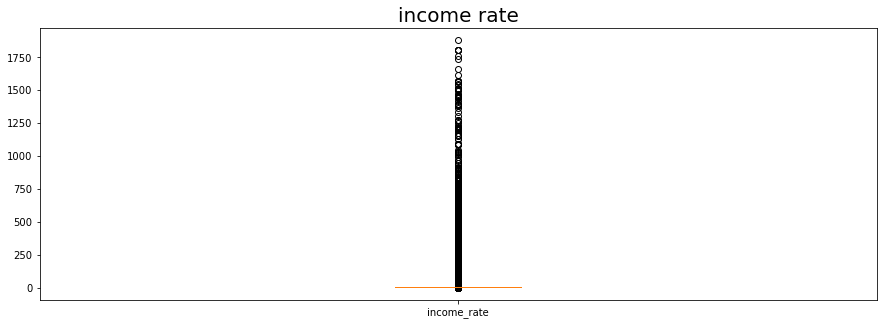

In [35]:
plt.figure(figsize=(15,5))
plt.title('income rate',fontsize=20)
plt.boxplot(no_outliers.income_rate, labels = ['income_rate'], showbox = True)
plt.savefig('../plots/income rate.jpg', dpi = 200, bbox_inches = 'tight')
plt.close

In [36]:
#delete outliers
iQ1 = no_outliers.income_rate.quantile(0.25)
iQ3 = no_outliers.income_rate.quantile(0.75)
iIQR =  iQ3 - iQ1

In [37]:
no_outliers =  no_outliers[~((no_outliers.income_rate < (iQ1 - 1.5 * iIQR)) | (no_outliers.income_rate > (iQ3 + 1.5 * iIQR)))]

<function matplotlib.pyplot.close(fig=None)>

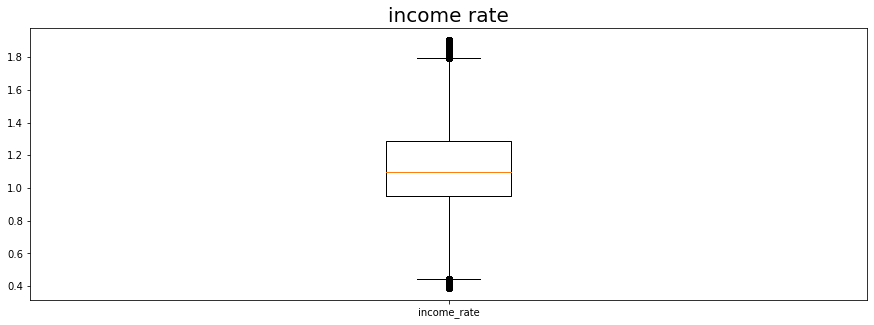

In [38]:
plt.figure(figsize=(15,5))
plt.title('income rate',fontsize=20)
plt.boxplot(no_outliers.income_rate, labels = ['income_rate'], showbox = True)
plt.close

#### visualization

In [39]:
#rate of money earned per hour
income_rate_hour = no_outliers[['hour', 'income_rate']].groupby(['hour']).mean()
income_rate_hour['hour'] = income_rate_hour.index

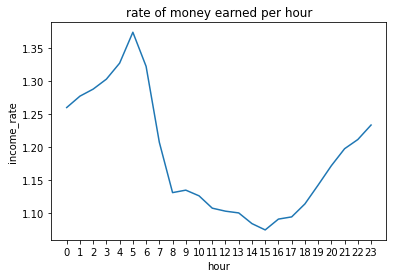

<function matplotlib.pyplot.close(fig=None)>

In [40]:
plt.plot(income_rate_hour.hour,income_rate_hour.income_rate)
plt.xticks(income_rate_hour.hour,range(0,24))
plt.title('rate of money earned per hour')
plt.xlabel('hour')
plt.ylabel('income_rate')
plt.savefig('../plots/rate of money earned per hour.jpg', dpi = 200, bbox_inches = 'tight')
plt.show()
plt.close

In [41]:
#rate of money earned each day
income_rate_date = no_outliers[['income_rate','day']].groupby(['day']).mean()
income_rate_date['day'] = income_rate_date.index
income_rate_date.reset_index(drop=True, inplace=True)

In [42]:
from pandas.api.types import CategoricalDtype
#sort dataframe
week = CategoricalDtype(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], 
    ordered=True
)
income_rate_date['day'] = income_rate_date['day'].astype(week)
income_rate_date = income_rate_date.sort_values('day')

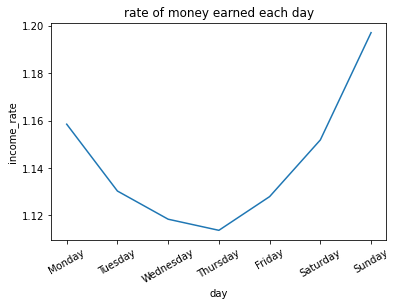

<function matplotlib.pyplot.close(fig=None)>

In [43]:
plt.plot(income_rate_date.day,income_rate_date.income_rate)
plt.title('rate of money earned each day')
plt.xticks(rotation = 30)
plt.xlabel('day')
plt.ylabel('income_rate')
plt.savefig('../plots/rate of money earned each day.jpg', dpi = 200, bbox_inches = 'tight')
plt.show()
plt.close

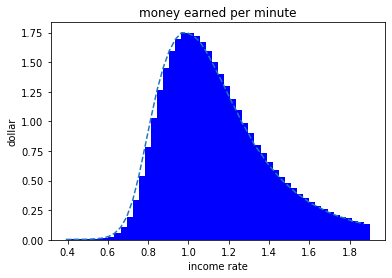

In [44]:
#show income_rate
n1, bins1, patches1 = plt.hist(no_outliers.income_rate, bins=50,  density=True, color='b', alpha=1)
plt.plot(bins1[:-1],n1,'--')
plt.title('money earned per minute')
plt.xlabel('income rate')
plt.ylabel("dollar")
plt.show()

In [45]:
import numpy as np
import scipy as sp
import seaborn as sns
from statsmodels.formula.api import ols

In [46]:
sample =  no_outliers.sample(n=10000, random_state=301)

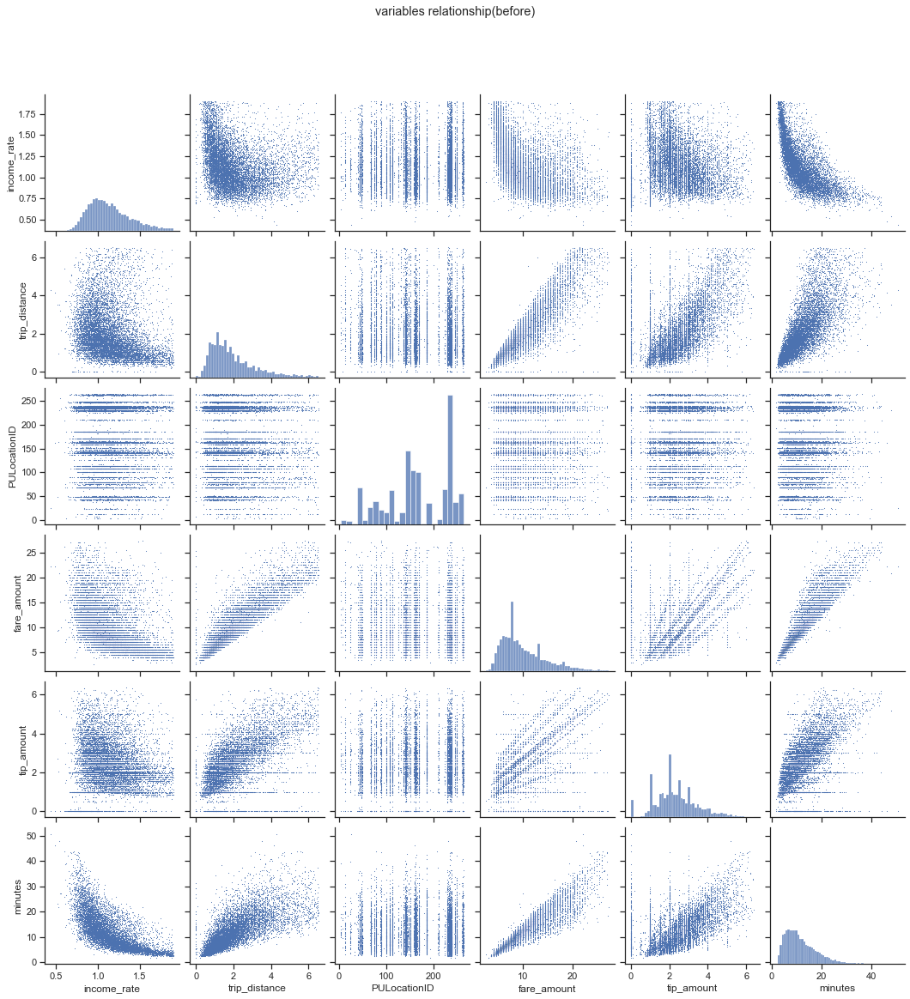

In [47]:
# use Scatter plot to check relationship of variables
sns.set(style = 'ticks', color_codes =True)
scatter = sns.pairplot(sample[['income_rate', 'trip_distance', 'PULocationID',  'fare_amount', 'tip_amount', 'minutes']], plot_kws= dict(s =1, edgecolor = 'b'))
scatter.fig.suptitle("variables relationship(before)", y=1.08)
scatter.savefig('../plots/variables relationship(before).jpg', dpi = 200, bbox_inches = 'tight')

In [48]:
#fit linear model
model = ols(
    formula= 'income_rate ~ trip_distance + fare_amount + tip_amount + minutes',
    data = sample
).fit()

In [49]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            income_rate   R-squared:                       0.698
Model:                            OLS   Adj. R-squared:                  0.697
Method:                 Least Squares   F-statistic:                     5763.
Date:                Fri, 26 Aug 2022   Prob (F-statistic):               0.00
Time:                        02:15:36   Log-Likelihood:                 5507.1
No. Observations:               10000   AIC:                        -1.100e+04
Df Residuals:                    9995   BIC:                        -1.097e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         1.2084      0.005    224.316

In [50]:
#transformation data
sample['tra_income_rate'] = 1 / sample['income_rate']
sample['tra_trip'] = np.sqrt(sample['trip_distance'])
sample['tra_fare'] = np.sqrt(sample['fare_amount'])
sample['tra_tip'] = np.sqrt(sample['tip_amount'])
sample['tra_minutes'] = np.sqrt(sample['minutes'])

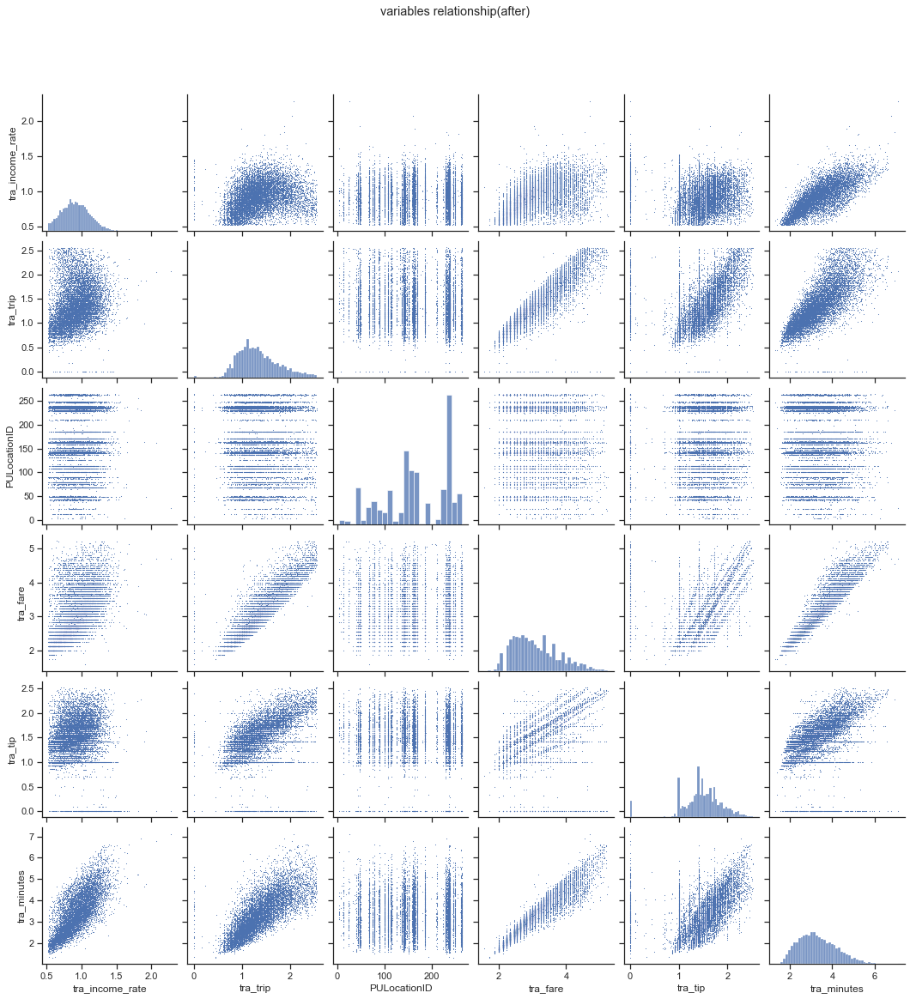

In [51]:
# use Scatter plot to check relationship of variables
sns.set(style = 'ticks', color_codes =True)
scatter = sns.pairplot(sample[['tra_income_rate', 'tra_trip', 'PULocationID',  'tra_fare', 'tra_tip', 'tra_minutes']], plot_kws= dict(s =1, edgecolor = 'b'))
scatter.fig.suptitle("variables relationship(after)", y=1.08)
scatter.savefig('../plots/variables relationship(after).jpg', dpi = 200, bbox_inches = 'tight')

In [52]:
model1 = ols(
    formula= 'tra_income_rate ~ tra_trip + tra_fare + tra_tip + tra_minutes',
    data = sample
).fit()

In [53]:
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:        tra_income_rate   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                 5.989e+04
Date:                Fri, 26 Aug 2022   Prob (F-statistic):               0.00
Time:                        02:15:42   Log-Likelihood:                 18125.
No. Observations:               10000   AIC:                        -3.624e+04
Df Residuals:                    9995   BIC:                        -3.620e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.8721      0.003    289.465      

In [54]:
[model.aic, model1.aic]

[-11004.280043439063, -36240.71704367803]

In [55]:
# prediction and residual for models
pred = model.fittedvalues.copy()
pred1 = model1.fittedvalues.copy()
true = sample.tra_income_rate.values.copy()
residual = true - pred
residual1 = true - pred1

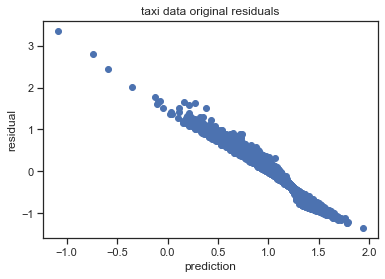

In [56]:
plt.scatter(pred, residual)
plt.title("taxi data original residuals")
plt.xlabel('prediction')
plt.ylabel('residual')
plt.savefig('../plots/taxi data original residuals.jpg', dpi = 200, bbox_inches = 'tight')
plt.show()

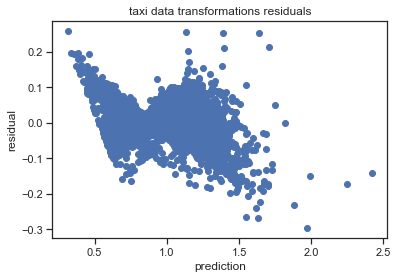

In [57]:
#homoscedasticity improved
plt.scatter(pred1, residual1)
plt.title("taxi data transformations residuals")
plt.xlabel('prediction')
plt.ylabel('residual')
plt.savefig('../plots/taxi data transformations residuals.jpg', dpi = 200, bbox_inches = 'tight')
plt.show()

In [58]:
no_outliers['date'] = no_outliers.tpep_pickup_datetime.astype('datetime64[D]')

In [59]:
covid

,Unnamed: 0,date_of_interest,CASE_COUNT,BX_CASE_COUNT,BK_CASE_COUNT,MN_CASE_COUNT,QN_CASE_COUNT,SI_CASE_COUNT
641,641,12/01/2021,2180,279,700,395,584,220
642,642,12/02/2021,2109,307,629,396,561,214
643,643,12/03/2021,1893,241,579,318,554,200
644,644,12/04/2021,1321,172,382,186,412,169
645,645,12/05/2021,1403,122,463,237,418,162
...,...,...,...,...,...,...,...,...
726,726,02/24/2022,660,77,176,204,163,40
727,727,02/25/2022,539,32,184,165,119,38
728,728,02/26/2022,337,32,105,109,69,21
729,729,02/27/2022,360,27,126,115,68,24


In [60]:
#check the relationship between covid case and income rate
covid['income_rate'] = list(no_outliers.groupby('date')['income_rate'].mean())

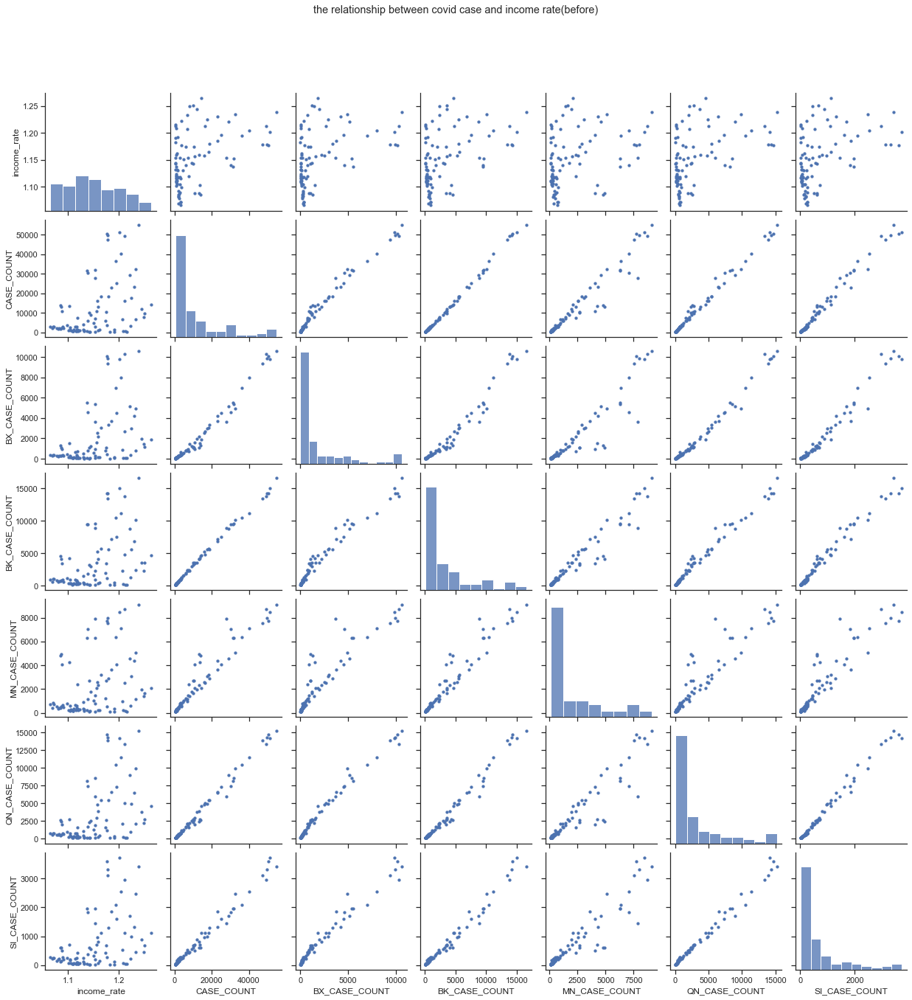

In [61]:
# use Scatter plot to check relationship of variables
sns.set(style = 'ticks', color_codes =True)
scatter = sns.pairplot(covid[['income_rate', 'CASE_COUNT',	'BX_CASE_COUNT', 'BK_CASE_COUNT',	'MN_CASE_COUNT',	'QN_CASE_COUNT'	,'SI_CASE_COUNT']], plot_kws= dict(s = 15, edgecolor = 'b'))
scatter.fig.suptitle("the relationship between covid case and income rate(before)", y=1.08)
scatter.savefig('../plots/the relationship between covid case and income rate(before).jpg', dpi = 200, bbox_inches = 'tight')

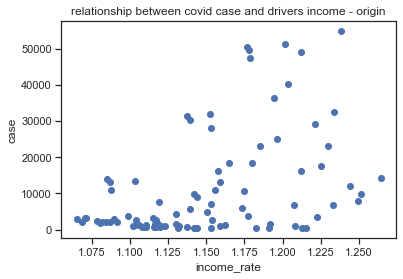

In [62]:
plt.scatter(covid.income_rate, covid.CASE_COUNT)
plt.title("relationship between covid case and drivers income - origin")
plt.xlabel('income_rate')
plt.ylabel('case')
plt.show()

In [63]:
#transforme income
tr_income_rate = np.sqrt(10 *covid.income_rate)
covid['tr_income_rate'] = tr_income_rate

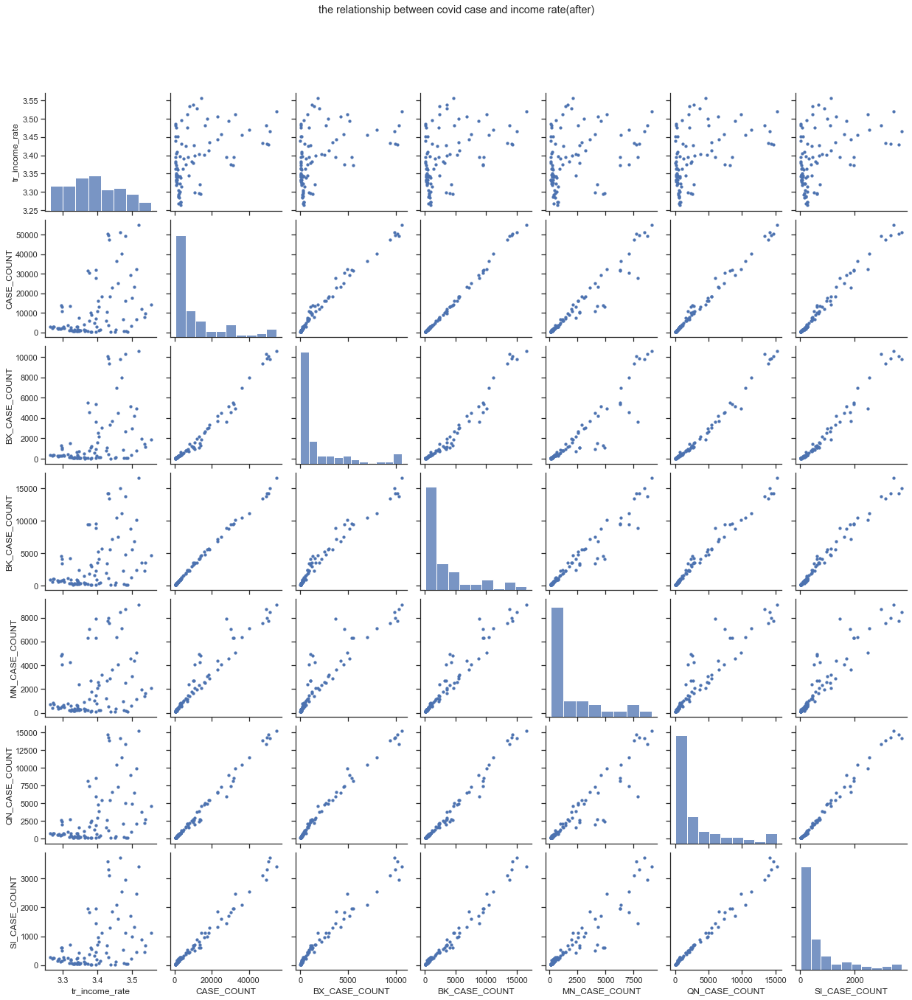

In [64]:
sns.set(style = 'ticks', color_codes =True)
scatter = sns.pairplot(covid[['tr_income_rate', 'CASE_COUNT',	'BX_CASE_COUNT', 'BK_CASE_COUNT',	'MN_CASE_COUNT',	'QN_CASE_COUNT'	,'SI_CASE_COUNT']], plot_kws= dict(s =15, edgecolor = 'b'))
scatter.fig.suptitle("the relationship between covid case and income rate(after)", y=1.08)
scatter.savefig('../plots/the relationship between covid case and income rate(after).jpg', dpi = 200, bbox_inches = 'tight')

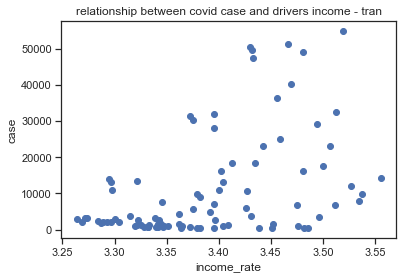

In [65]:
plt.scatter(tr_income_rate, covid.CASE_COUNT)
plt.title("relationship between covid case and drivers income - tran")
plt.xlabel('income_rate')
plt.ylabel('case')
plt.show()

In [66]:
covid_income =  ols(
    formula= 'income_rate ~ CASE_COUNT+ BX_CASE_COUNT+ BK_CASE_COUNT+	MN_CASE_COUNT+ QN_CASE_COUNT+ SI_CASE_COUNT',
    data = covid
).fit()

In [67]:
print(covid_income.summary())

                            OLS Regression Results                            
Dep. Variable:            income_rate   R-squared:                       0.494
Model:                            OLS   Adj. R-squared:                  0.457
Method:                 Least Squares   F-statistic:                     13.50
Date:                Fri, 26 Aug 2022   Prob (F-statistic):           1.26e-10
Time:                        02:15:55   Log-Likelihood:                 171.49
No. Observations:                  90   AIC:                            -329.0
Df Residuals:                      83   BIC:                            -311.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         1.1333      0.006    194.024

In [68]:
covid_income1 =  ols(
    formula= 'tr_income_rate ~ CASE_COUNT+ BX_CASE_COUNT+ BK_CASE_COUNT+ MN_CASE_COUNT+ QN_CASE_COUNT+ SI_CASE_COUNT',
    data = covid
).fit()

In [69]:
print(covid_income1.summary())

                            OLS Regression Results                            
Dep. Variable:         tr_income_rate   R-squared:                       0.494
Model:                            OLS   Adj. R-squared:                  0.457
Method:                 Least Squares   F-statistic:                     13.48
Date:                Fri, 26 Aug 2022   Prob (F-statistic):           1.29e-10
Time:                        02:15:55   Log-Likelihood:                 136.79
No. Observations:                  90   AIC:                            -259.6
Df Residuals:                      83   BIC:                            -242.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         3.3659      0.009    391.892

In [70]:
# prediction and residual for models
pred_c = covid_income.fittedvalues.copy()
pred1_c = covid_income1.fittedvalues.copy()
true_c = covid.tr_income_rate.values.copy()
residual_c = true_c - pred_c
residual1_c = true_c - pred1_c

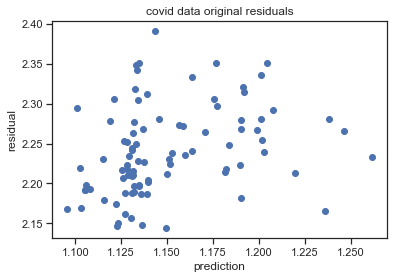

In [71]:
plt.scatter(pred_c, residual_c)
plt.title("covid data original residuals")
plt.xlabel('prediction')
plt.ylabel('residual')
plt.savefig('../plots/covid data original residuals.jpg', dpi = 200, bbox_inches = 'tight')
plt.show()

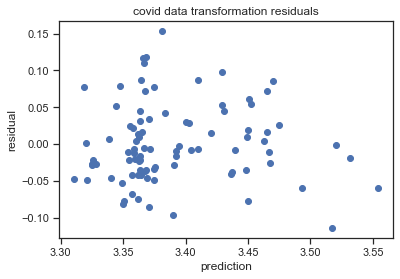

In [72]:
#homoscedasticity improved
plt.scatter(pred1_c, residual1_c)
plt.title("covid data transformation residuals")
plt.xlabel('prediction')
plt.ylabel('residual')
plt.savefig('../plots/covid data transformation residuals.jpg', dpi = 200, bbox_inches = 'tight')
plt.show()

In [73]:
#mutual information
from sklearn import metrics
print(metrics.mutual_info_score(covid.income_rate,covid.CASE_COUNT))

4.499809670330265


c:\Users\aufb\anaconda3\lib\site-packages\sklearn\metrics\cluster\_supervised.py:65: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


In [75]:
import folium
import geopandas as gpd

ModuleNotFoundError: No module named 'folium'

In [ ]:
shp = gpd.read_file("../data/raw/taxi_zones.shp")
zones = pd.read_csv("../data/raw/taxi_zones.csv")

In [ ]:
#Change to geographic coordinates
shp['geometry'] = shp['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

In [ ]:
zones

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone
...,...,...,...,...
260,261,Manhattan,World Trade Center,Yellow Zone
261,262,Manhattan,Yorkville East,Yellow Zone
262,263,Manhattan,Yorkville West,Yellow Zone
263,264,Unknown,NV,NaN


In [ ]:
shp

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."
...,...,...,...,...,...,...,...
258,259,0.126750,0.000395,Woodlawn/Wakefield,259,Bronx,"POLYGON ((-73.85107 40.91037, -73.85207 40.909..."
259,260,0.133514,0.000422,Woodside,260,Queens,"POLYGON ((-73.90175 40.76078, -73.90147 40.759..."
260,261,0.027120,0.000034,World Trade Center,261,Manhattan,"POLYGON ((-74.01333 40.70503, -74.01327 40.704..."
261,262,0.049064,0.000122,Yorkville East,262,Manhattan,"MULTIPOLYGON (((-73.94383 40.78286, -73.94376 ..."


In [ ]:
#merge dataframe
new_zones = gpd.GeoDataFrame(
    pd.merge(zones, shp, on= 'LocationID', how= 'inner')
)
new_zones

,LocationID,Borough,Zone,service_zone,OBJECTID,Shape_Leng,Shape_Area,zone,borough,geometry
0,1,EWR,Newark Airport,EWR,1,0.116357,0.000782,Newark Airport,EWR,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,2,Queens,Jamaica Bay,Boro Zone,2,0.433470,0.004866,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone,3,0.084341,0.000314,Allerton/Pelham Gardens,Bronx,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,4,Manhattan,Alphabet City,Yellow Zone,4,0.043567,0.000112,Alphabet City,Manhattan,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,5,Staten Island,Arden Heights,Boro Zone,5,0.092146,0.000498,Arden Heights,Staten Island,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."
...,...,...,...,...,...,...,...,...,...,...
258,259,Bronx,Woodlawn/Wakefield,Boro Zone,259,0.126750,0.000395,Woodlawn/Wakefield,Bronx,"POLYGON ((-73.85107 40.91037, -73.85207 40.909..."
259,260,Queens,Woodside,Boro Zone,260,0.133514,0.000422,Woodside,Queens,"POLYGON ((-73.90175 40.76078, -73.90147 40.759..."
260,261,Manhattan,World Trade Center,Yellow Zone,261,0.027120,0.000034,World Trade Center,Manhattan,"POLYGON ((-74.01333 40.70503, -74.01327 40.704..."
261,262,Manhattan,Yorkville East,Yellow Zone,262,0.049064,0.000122,Yorkville East,Manhattan,"MULTIPOLYGON (((-73.94383 40.78286, -73.94376 ..."


In [ ]:
#change data to json
newjson = new_zones[['LocationID', 'geometry']].drop_duplicates('LocationID').to_json()

In [ ]:
#  create newyork map
map = folium.Map(location = [40.66, -73.94], titles = "Stamen Terrain", zoom_start= 11, zoom_control=False, scrollWheelZoom=False, dragging=False)

In [ ]:
#show income_rate
income_mean = no_outliers[['PULocationID', 'income_rate']].groupby('PULocationID').mean()

In [ ]:
income_mean['PULocationID'] = income_mean.index


In [ ]:
income_mean.describe()

,income_rate,PULocationID
count,253.000000,253.000000
mean,1.132625,134.501976
std,0.127426,76.791132
min,0.472432,1.000000
25%,1.078778,67.000000
50%,1.132917,136.000000
75%,1.178040,200.000000
max,1.571320,265.000000


In [ ]:
# http://python-visualization.github.io/folium/modules.html?highlight=choropleth#folium.features.Choropleth
add_map = folium.Choropleth(
    geo_data=newjson, 
    name='choropleth', 
    data=income_mean, 
    columns=['PULocationID','income_rate'], 
    key_on='properties.LocationID', 
    fill_color='Paired', 
    nan_fill_color='black',
    legend_name='Ave Income rate'
)

add_map.add_to(map)
map.save('../plots/map total.html')
map

In [ ]:
# Respectively show each month's map
# 2021-12 to 2022-01
no_outliers_covid = no_outliers[(no_outliers['tpep_pickup_datetime'] < '2022-02-01 00:00:00')]
income_mean_covid = no_outliers_covid[['PULocationID', 'income_rate']].groupby('PULocationID').mean()
income_mean_covid['PULocationID'] = income_mean_covid.index

In [ ]:
#  create newyork  2021-12 to 2022-01 map
map_covid = folium.Map(location = [40.66, -73.94], titles = "Stamen Terrain", zoom_start= 11, zoom_control=False, scrollWheelZoom=False, dragging=False)
# http://python-visualization.github.io/folium/modules.html?highlight=choropleth#folium.features.Choropleth
add_map_covid = folium.Choropleth(
    geo_data=newjson, 
    name='choropleth', 
    data=income_mean_covid, 
    columns=['PULocationID','income_rate'], 
    key_on='properties.LocationID', 
    fill_color='Paired', 
    nan_fill_color='black',
    legend_name='Ave Income rate'
)

add_map_covid.add_to(map_covid)
map_covid.save('../plots/map 12-01.html')
map_covid

In [ ]:
# 2022-02
no_outliers_2 = no_outliers[~(no_outliers['tpep_pickup_datetime'] < '2022-02-01 00:00:00')]
income_mean_2 = no_outliers_2[['PULocationID', 'income_rate']].groupby('PULocationID').mean()
income_mean_2['PULocationID'] = income_mean_2.index

In [ ]:
no_outliers_2

,tpep_pickup_datetime,tpep_dropoff_datetime,trip_distance,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,minutes,income,income_rate,hour,day,date
1237822,2022-02-12 08:08:31,2022-02-12 08:14:24,2.15,158,170,2,7.50,1.594316,5.883333,9.094316,1.545776,8,Saturday,2022-02-12
1240680,2022-02-12 08:16:21,2022-02-12 08:24:21,2.06,170,236,1,8.50,2.460000,8.000000,10.960000,1.370000,8,Saturday,2022-02-12
2816776,2022-02-07 20:57:28,2022-02-07 21:02:08,0.66,48,230,2,5.00,1.062877,4.666667,6.062877,1.299188,20,Monday,2022-02-07
3934142,2022-02-01 03:00:05,2022-02-01 03:15:08,2.62,239,162,2,12.00,2.550906,15.050000,14.550906,0.966838,3,Tuesday,2022-02-01
3938504,2022-02-01 03:30:04,2022-02-01 03:34:05,0.85,262,236,2,5.00,1.062877,4.016667,6.062877,1.509430,3,Tuesday,2022-02-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8657074,2022-02-28 23:50:00,2022-03-01 00:06:00,3.40,163,193,0,14.37,0.000000,16.000000,14.370000,0.898125,23,Monday,2022-02-28
8657075,2022-02-28 23:06:57,2022-02-28 23:19:12,3.48,141,4,0,14.51,2.000000,12.250000,16.510000,1.347755,23,Monday,2022-02-28
8657076,2022-02-28 23:48:13,2022-03-01 00:03:33,3.05,161,151,0,14.38,3.810000,15.333333,18.190000,1.186304,23,Monday,2022-02-28
8657077,2022-02-28 23:56:41,2022-03-01 00:04:57,2.62,141,226,0,12.53,1.710000,8.266667,14.240000,1.722581,23,Monday,2022-02-28


In [ ]:
#  create newyork  2022-02 map
map_2 = folium.Map(location = [40.66, -73.94], titles = "Stamen Terrain", zoom_start= 11, zoom_control=False, scrollWheelZoom=False, dragging=False)
# http://python-visualization.github.io/folium/modules.html?highlight=choropleth#folium.features.Choropleth
add_map_2 = folium.Choropleth(
    geo_data=newjson, 
    name='choropleth', 
    data=income_mean_2, 
    columns=['PULocationID','income_rate'], 
    key_on='properties.LocationID', 
    fill_color='Paired', 
    nan_fill_color='black',
    legend_name='Ave Income rate'
)

add_map_2.add_to(map_2)
map_2.save('../plots/map 02.html')
map_2

In [ ]:
covid_per = covid[(covid['date_of_interest'] < '02/01/2022') | (covid['date_of_interest'] >= '12/01/2021')]
covid_per[['BX_CASE_COUNT', 'BK_CASE_COUNT', 'MN_CASE_COUNT', 'QN_CASE_COUNT','SI_CASE_COUNT']].mean()

BX_CASE_COUNT    2603.322581
BK_CASE_COUNT    4722.516129
MN_CASE_COUNT    2957.580645
QN_CASE_COUNT    4281.725806
SI_CASE_COUNT    1009.096774
dtype: float64

In [ ]:
covid_after = covid[(covid['date_of_interest'] >= '02/01/2022') & (covid['date_of_interest'] <= '02/28/2022') ]
covid_after[['BX_CASE_COUNT', 'BK_CASE_COUNT', 'MN_CASE_COUNT', 'QN_CASE_COUNT','SI_CASE_COUNT']].mean()

BX_CASE_COUNT    107.250000
BK_CASE_COUNT    320.785714
MN_CASE_COUNT    247.964286
QN_CASE_COUNT    234.428571
SI_CASE_COUNT     67.321429
dtype: float64